# **Finetune PaliGemma**

In [ ]:
from transformers import (
    PaliGemmaProcessor,
    PaliGemmaForConditionalGeneration,
)
from transformers.image_utils import load_image
import torch
from datasets import load_dataset

In [ ]:
dataset = load_dataset("FastJobs/Visual_Emotional_Analysis")
split_dataset = dataset['train'].train_test_split(test_size=0.2)

# Memisahkan data latih dan data uji
ds_train = split_dataset['train']
ds_test = split_dataset['test']


README.md:   0%|          | 0.00/92.0 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/800 [00:00<?, ?it/s]

image0000060.jpg:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

image0000195.jpg:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

image0000333.jpg:   0%|          | 0.00/5.92k [00:00<?, ?B/s]

image0000066.jpg:   0%|          | 0.00/5.89k [00:00<?, ?B/s]

image0000132.jpg:   0%|          | 0.00/6.91k [00:00<?, ?B/s]

image0000182.jpg:   0%|          | 0.00/5.13k [00:00<?, ?B/s]

image0000061.jpg:   0%|          | 0.00/5.91k [00:00<?, ?B/s]

image0000346.jpg:   0%|          | 0.00/6.10k [00:00<?, ?B/s]

image0000213.jpg:   0%|          | 0.00/4.86k [00:00<?, ?B/s]

image0000228.jpg:   0%|          | 0.00/5.78k [00:00<?, ?B/s]

image0000138.jpg:   0%|          | 0.00/5.34k [00:00<?, ?B/s]

image0000106.jpg:   0%|          | 0.00/6.13k [00:00<?, ?B/s]

image0000343.jpg:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

image0000356.jpg:   0%|          | 0.00/6.31k [00:00<?, ?B/s]

image0000294.jpg:   0%|          | 0.00/5.79k [00:00<?, ?B/s]

image0000006.jpg:   0%|          | 0.00/6.40k [00:00<?, ?B/s]

image0000368.jpg:   0%|          | 0.00/6.19k [00:00<?, ?B/s]

image0000374.jpg:   0%|          | 0.00/5.42k [00:00<?, ?B/s]

image0000399.jpg:   0%|          | 0.00/5.66k [00:00<?, ?B/s]

image0000390.jpg:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

image0000441.jpg:   0%|          | 0.00/5.95k [00:00<?, ?B/s]

image0000450.jpg:   0%|          | 0.00/6.39k [00:00<?, ?B/s]

image0000690.jpg:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

image0000513.jpg:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

image0000511.jpg:   0%|          | 0.00/6.28k [00:00<?, ?B/s]

image0000602.jpg:   0%|          | 0.00/5.60k [00:00<?, ?B/s]

image0000697.jpg:   0%|          | 0.00/5.96k [00:00<?, ?B/s]

image0000470.jpg:   0%|          | 0.00/6.90k [00:00<?, ?B/s]

image0000593.jpg:   0%|          | 0.00/6.34k [00:00<?, ?B/s]

image0000415.jpg:   0%|          | 0.00/7.02k [00:00<?, ?B/s]

image0000407.jpg:   0%|          | 0.00/4.99k [00:00<?, ?B/s]

image0000416.jpg:   0%|          | 0.00/5.92k [00:00<?, ?B/s]

image0000722.jpg:   0%|          | 0.00/5.37k [00:00<?, ?B/s]

image0000758.jpg:   0%|          | 0.00/5.23k [00:00<?, ?B/s]

image0000723.jpg:   0%|          | 0.00/7.08k [00:00<?, ?B/s]

image0000776.jpg:   0%|          | 0.00/6.65k [00:00<?, ?B/s]

image0000825.jpg:   0%|          | 0.00/6.12k [00:00<?, ?B/s]

image0000908.jpg:   0%|          | 0.00/4.81k [00:00<?, ?B/s]

image0000932.jpg:   0%|          | 0.00/6.81k [00:00<?, ?B/s]

image0001015.jpg:   0%|          | 0.00/6.23k [00:00<?, ?B/s]

image0000949.jpg:   0%|          | 0.00/7.41k [00:00<?, ?B/s]

image0000965.jpg:   0%|          | 0.00/6.25k [00:00<?, ?B/s]

image0001061.jpg:   0%|          | 0.00/5.91k [00:00<?, ?B/s]

image0000972.jpg:   0%|          | 0.00/7.06k [00:00<?, ?B/s]

image0000963.jpg:   0%|          | 0.00/4.82k [00:00<?, ?B/s]

image0000923.jpg:   0%|          | 0.00/5.43k [00:00<?, ?B/s]

image0000996.jpg:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

image0001021.jpg:   0%|          | 0.00/6.62k [00:00<?, ?B/s]

image0001062.jpg:   0%|          | 0.00/6.20k [00:00<?, ?B/s]

image0001063.jpg:   0%|          | 0.00/4.76k [00:00<?, ?B/s]

image0001086.jpg:   0%|          | 0.00/5.16k [00:00<?, ?B/s]

image0001120.jpg:   0%|          | 0.00/5.68k [00:00<?, ?B/s]

image0001066.jpg:   0%|          | 0.00/6.37k [00:00<?, ?B/s]

image0001113.jpg:   0%|          | 0.00/5.48k [00:00<?, ?B/s]

image0001161.jpg:   0%|          | 0.00/5.47k [00:00<?, ?B/s]

image0001314.jpg:   0%|          | 0.00/5.35k [00:00<?, ?B/s]

image0001241.jpg:   0%|          | 0.00/6.41k [00:00<?, ?B/s]

image0001152.jpg:   0%|          | 0.00/5.54k [00:00<?, ?B/s]

image0001283.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

image0001296.jpg:   0%|          | 0.00/5.53k [00:00<?, ?B/s]

image0001322.jpg:   0%|          | 0.00/7.33k [00:00<?, ?B/s]

image0001244.jpg:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

image0001305.jpg:   0%|          | 0.00/5.95k [00:00<?, ?B/s]

image0001341.jpg:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

image0001258.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

image0001470.jpg:   0%|          | 0.00/5.87k [00:00<?, ?B/s]

image0001375.jpg:   0%|          | 0.00/6.09k [00:00<?, ?B/s]

image0001453.jpg:   0%|          | 0.00/5.81k [00:00<?, ?B/s]

image0001348.jpg:   0%|          | 0.00/6.33k [00:00<?, ?B/s]

image0001516.jpg:   0%|          | 0.00/6.15k [00:00<?, ?B/s]

image0001555.jpg:   0%|          | 0.00/5.58k [00:00<?, ?B/s]

image0001615.jpg:   0%|          | 0.00/6.84k [00:00<?, ?B/s]

image0001538.jpg:   0%|          | 0.00/4.87k [00:00<?, ?B/s]

image0001524.jpg:   0%|          | 0.00/6.41k [00:00<?, ?B/s]

image0001529.jpg:   0%|          | 0.00/6.56k [00:00<?, ?B/s]

image0001568.jpg:   0%|          | 0.00/5.88k [00:00<?, ?B/s]

image0001527.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

image0001600.jpg:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

image0001671.jpg:   0%|          | 0.00/6.30k [00:00<?, ?B/s]

image0001521.jpg:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

image0001623.jpg:   0%|          | 0.00/4.67k [00:00<?, ?B/s]

image0001765.jpg:   0%|          | 0.00/5.26k [00:00<?, ?B/s]

image0001741.jpg:   0%|          | 0.00/5.71k [00:00<?, ?B/s]

image0001773.jpg:   0%|          | 0.00/6.30k [00:00<?, ?B/s]

image0001688.jpg:   0%|          | 0.00/7.88k [00:00<?, ?B/s]

image0001778.jpg:   0%|          | 0.00/5.56k [00:00<?, ?B/s]

image0001833.jpg:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

image0001794.jpg:   0%|          | 0.00/6.05k [00:00<?, ?B/s]

image0001934.jpg:   0%|          | 0.00/5.34k [00:00<?, ?B/s]

image0001949.jpg:   0%|          | 0.00/4.86k [00:00<?, ?B/s]

image0001956.jpg:   0%|          | 0.00/7.00k [00:00<?, ?B/s]

image0001892.jpg:   0%|          | 0.00/7.09k [00:00<?, ?B/s]

image0001857.jpg:   0%|          | 0.00/6.20k [00:00<?, ?B/s]

image0001933.jpg:   0%|          | 0.00/6.22k [00:00<?, ?B/s]

image0001861.jpg:   0%|          | 0.00/7.16k [00:00<?, ?B/s]

image0001849.jpg:   0%|          | 0.00/5.25k [00:00<?, ?B/s]

image0001916.jpg:   0%|          | 0.00/7.48k [00:00<?, ?B/s]

image0001990.jpg:   0%|          | 0.00/6.22k [00:00<?, ?B/s]

image0001974.jpg:   0%|          | 0.00/6.13k [00:00<?, ?B/s]

image0002009.jpg:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

ffhq_1.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_100.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_101.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_10.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_17.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_14.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_104.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_12.png:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

ffhq_15.png:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

ffhq_103.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_13.png:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

ffhq_102.png:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

ffhq_11.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_19.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_23.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_22.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_21.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_20.png:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

ffhq_25.png:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

ffhq_24.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_27.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_28.png:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

ffhq_26.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_30.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_32.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_37.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_3.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_31.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_33.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_34.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_35.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_38.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_36.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_4.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_41.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_40.png:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

ffhq_44.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_46.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_42.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_48.png:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

ffhq_55.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_45.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_51.png:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

ffhq_54.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_5.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_52.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_49.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_47.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_53.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_56.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_58.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_57.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_6.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_61.png:   0%|          | 0.00/24.0k [00:00<?, ?B/s]

ffhq_71.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_67.png:   0%|          | 0.00/23.4k [00:00<?, ?B/s]

ffhq_69.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_64.png:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

ffhq_66.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_7.png:   0%|          | 0.00/23.3k [00:00<?, ?B/s]

ffhq_59.png:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

ffhq_62.png:   0%|          | 0.00/23.0k [00:00<?, ?B/s]

ffhq_63.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_70.png:   0%|          | 0.00/23.4k [00:00<?, ?B/s]

ffhq_65.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_72.png:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

ffhq_75.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_82.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_83.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_81.png:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

ffhq_8.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_74.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_76.png:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

ffhq_77.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_73.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_85.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_86.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_84.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_87.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_78.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_88.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_89.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_92.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_91.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_9.png:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

ffhq_90.png:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

ffhq_98.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_99.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

image0000160.jpg:   0%|          | 0.00/6.51k [00:00<?, ?B/s]

image0000999.jpg:   0%|          | 0.00/5.71k [00:00<?, ?B/s]

image0000094.jpg:   0%|          | 0.00/7.14k [00:00<?, ?B/s]

image0000337.jpg:   0%|          | 0.00/6.13k [00:00<?, ?B/s]

ffhq_94.png:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

ffhq_95.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_96.png:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

ffhq_93.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

image0001046.jpg:   0%|          | 0.00/5.63k [00:00<?, ?B/s]

image0001171.jpg:   0%|          | 0.00/4.53k [00:00<?, ?B/s]

image0001105.jpg:   0%|          | 0.00/5.50k [00:00<?, ?B/s]

ffhq_1.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_13.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_20.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

image0001151.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

ffhq_11.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_12.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_10.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_15.png:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

ffhq_2.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_0.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_23.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_21.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_22.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_24.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_25.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_3.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_26.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_31.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_36.png:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

ffhq_27.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_37.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_35.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_28.png:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

ffhq_29.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_34.png:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

ffhq_38.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_32.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_30.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_39.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_43.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_4.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_40.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_44.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_42.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_46.png:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

ffhq_49.png:   0%|          | 0.00/23.7k [00:00<?, ?B/s]

ffhq_53.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_7.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_45.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_8.png:   0%|          | 0.00/22.7k [00:00<?, ?B/s]

ffhq_48.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_52.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_6.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_5.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_47.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

image0000523.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

image0001041.jpg:   0%|          | 0.00/5.23k [00:00<?, ?B/s]

ffhq_9.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

image0000197.jpg:   0%|          | 0.00/6.19k [00:00<?, ?B/s]

image0000630.jpg:   0%|          | 0.00/5.61k [00:00<?, ?B/s]

image0000490.jpg:   0%|          | 0.00/6.80k [00:00<?, ?B/s]

image0001941.jpg:   0%|          | 0.00/5.86k [00:00<?, ?B/s]

image0001561.jpg:   0%|          | 0.00/6.31k [00:00<?, ?B/s]

image0000866.jpg:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

image0002367.jpg:   0%|          | 0.00/5.65k [00:00<?, ?B/s]

image0001300.jpg:   0%|          | 0.00/7.19k [00:00<?, ?B/s]

image0001169.jpg:   0%|          | 0.00/5.48k [00:00<?, ?B/s]

image0001274.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

image0001060.jpg:   0%|          | 0.00/5.78k [00:00<?, ?B/s]

image0002657.jpg:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

image0002476.jpg:   0%|          | 0.00/5.69k [00:00<?, ?B/s]

image0003432.jpg:   0%|          | 0.00/6.93k [00:00<?, ?B/s]

image0003186.jpg:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

image0003333.jpg:   0%|          | 0.00/7.39k [00:00<?, ?B/s]

image0002805.jpg:   0%|          | 0.00/6.04k [00:00<?, ?B/s]

image0003405.jpg:   0%|          | 0.00/5.19k [00:00<?, ?B/s]

image0002926.jpg:   0%|          | 0.00/6.33k [00:00<?, ?B/s]

image0003451.jpg:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

image0003672.jpg:   0%|          | 0.00/6.43k [00:00<?, ?B/s]

image0004560.jpg:   0%|          | 0.00/4.66k [00:00<?, ?B/s]

image0003462.jpg:   0%|          | 0.00/5.33k [00:00<?, ?B/s]

image0005965.jpg:   0%|          | 0.00/5.84k [00:00<?, ?B/s]

image0004928.jpg:   0%|          | 0.00/6.28k [00:00<?, ?B/s]

image0005115.jpg:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

image0004710.jpg:   0%|          | 0.00/5.54k [00:00<?, ?B/s]

image0004758.jpg:   0%|          | 0.00/6.07k [00:00<?, ?B/s]

image0005367.jpg:   0%|          | 0.00/6.23k [00:00<?, ?B/s]

image0006197.jpg:   0%|          | 0.00/6.42k [00:00<?, ?B/s]

image0006249.jpg:   0%|          | 0.00/5.41k [00:00<?, ?B/s]

image0006914.jpg:   0%|          | 0.00/5.41k [00:00<?, ?B/s]

image0006270.jpg:   0%|          | 0.00/6.39k [00:00<?, ?B/s]

image0006353.jpg:   0%|          | 0.00/6.02k [00:00<?, ?B/s]

image0006804.jpg:   0%|          | 0.00/6.51k [00:00<?, ?B/s]

image0007323.jpg:   0%|          | 0.00/5.93k [00:00<?, ?B/s]

image0007594.jpg:   0%|          | 0.00/6.36k [00:00<?, ?B/s]

image0006991.jpg:   0%|          | 0.00/5.84k [00:00<?, ?B/s]

image0007374.jpg:   0%|          | 0.00/5.08k [00:00<?, ?B/s]

image0007233.jpg:   0%|          | 0.00/7.77k [00:00<?, ?B/s]

image0007128.jpg:   0%|          | 0.00/4.69k [00:00<?, ?B/s]

image0007085.jpg:   0%|          | 0.00/6.27k [00:00<?, ?B/s]

image0007577.jpg:   0%|          | 0.00/6.43k [00:00<?, ?B/s]

image0006955.jpg:   0%|          | 0.00/6.18k [00:00<?, ?B/s]

image0007667.jpg:   0%|          | 0.00/7.75k [00:00<?, ?B/s]

image0007915.jpg:   0%|          | 0.00/6.37k [00:00<?, ?B/s]

image0008644.jpg:   0%|          | 0.00/5.57k [00:00<?, ?B/s]

image0007682.jpg:   0%|          | 0.00/5.29k [00:00<?, ?B/s]

image0007856.jpg:   0%|          | 0.00/7.07k [00:00<?, ?B/s]

image0007994.jpg:   0%|          | 0.00/4.77k [00:00<?, ?B/s]

image0008568.jpg:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

image0000694.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

image0000419.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

image0000808.jpg:   0%|          | 0.00/7.09k [00:00<?, ?B/s]

image0000284.jpg:   0%|          | 0.00/5.51k [00:00<?, ?B/s]

image0000701.jpg:   0%|          | 0.00/6.95k [00:00<?, ?B/s]

image0000285.jpg:   0%|          | 0.00/6.90k [00:00<?, ?B/s]

image0000451.jpg:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

image0000473.jpg:   0%|          | 0.00/7.01k [00:00<?, ?B/s]

image0000777.jpg:   0%|          | 0.00/5.43k [00:00<?, ?B/s]

image0000815.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

image0000842.jpg:   0%|          | 0.00/4.89k [00:00<?, ?B/s]

image0000915.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

image0001001.jpg:   0%|          | 0.00/6.06k [00:00<?, ?B/s]

image0000843.jpg:   0%|          | 0.00/5.87k [00:00<?, ?B/s]

image0001247.jpg:   0%|          | 0.00/6.93k [00:00<?, ?B/s]

image0001038.jpg:   0%|          | 0.00/6.38k [00:00<?, ?B/s]

image0001316.jpg:   0%|          | 0.00/5.52k [00:00<?, ?B/s]

image0001685.jpg:   0%|          | 0.00/5.63k [00:00<?, ?B/s]

image0001454.jpg:   0%|          | 0.00/4.18k [00:00<?, ?B/s]

image0001286.jpg:   0%|          | 0.00/5.17k [00:00<?, ?B/s]

image0001651.jpg:   0%|          | 0.00/4.96k [00:00<?, ?B/s]

image0002217.jpg:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

image0002031.jpg:   0%|          | 0.00/5.24k [00:00<?, ?B/s]

image0001991.jpg:   0%|          | 0.00/6.08k [00:00<?, ?B/s]

image0001458.jpg:   0%|          | 0.00/4.77k [00:00<?, ?B/s]

image0001977.jpg:   0%|          | 0.00/6.08k [00:00<?, ?B/s]

image0002354.jpg:   0%|          | 0.00/5.34k [00:00<?, ?B/s]

image0002443.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

image0002406.jpg:   0%|          | 0.00/6.07k [00:00<?, ?B/s]

image0002309.jpg:   0%|          | 0.00/5.83k [00:00<?, ?B/s]

image0002352.jpg:   0%|          | 0.00/6.17k [00:00<?, ?B/s]

image0002452.jpg:   0%|          | 0.00/6.72k [00:00<?, ?B/s]

image0002832.jpg:   0%|          | 0.00/6.74k [00:00<?, ?B/s]

image0002748.jpg:   0%|          | 0.00/5.51k [00:00<?, ?B/s]

image0002849.jpg:   0%|          | 0.00/6.10k [00:00<?, ?B/s]

image0002967.jpg:   0%|          | 0.00/6.65k [00:00<?, ?B/s]

image0003057.jpg:   0%|          | 0.00/5.31k [00:00<?, ?B/s]

image0002575.jpg:   0%|          | 0.00/6.08k [00:00<?, ?B/s]

image0002707.jpg:   0%|          | 0.00/5.76k [00:00<?, ?B/s]

image0002620.jpg:   0%|          | 0.00/6.12k [00:00<?, ?B/s]

image0003125.jpg:   0%|          | 0.00/5.95k [00:00<?, ?B/s]

image0003146.jpg:   0%|          | 0.00/6.68k [00:00<?, ?B/s]

image0003155.jpg:   0%|          | 0.00/6.21k [00:00<?, ?B/s]

image0003201.jpg:   0%|          | 0.00/4.90k [00:00<?, ?B/s]

image0003350.jpg:   0%|          | 0.00/6.65k [00:00<?, ?B/s]

image0003420.jpg:   0%|          | 0.00/5.91k [00:00<?, ?B/s]

image0003227.jpg:   0%|          | 0.00/6.29k [00:00<?, ?B/s]

image0003306.jpg:   0%|          | 0.00/6.79k [00:00<?, ?B/s]

image0003731.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

image0003630.jpg:   0%|          | 0.00/5.12k [00:00<?, ?B/s]

image0003616.jpg:   0%|          | 0.00/5.33k [00:00<?, ?B/s]

image0003727.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

image0003514.jpg:   0%|          | 0.00/6.03k [00:00<?, ?B/s]

image0003474.jpg:   0%|          | 0.00/5.51k [00:00<?, ?B/s]

image0003629.jpg:   0%|          | 0.00/6.11k [00:00<?, ?B/s]

image0003849.jpg:   0%|          | 0.00/6.66k [00:00<?, ?B/s]

image0003796.jpg:   0%|          | 0.00/6.17k [00:00<?, ?B/s]

image0004567.jpg:   0%|          | 0.00/6.14k [00:00<?, ?B/s]

image0004481.jpg:   0%|          | 0.00/5.60k [00:00<?, ?B/s]

image0004079.jpg:   0%|          | 0.00/6.23k [00:00<?, ?B/s]

image0004251.jpg:   0%|          | 0.00/5.01k [00:00<?, ?B/s]

image0004362.jpg:   0%|          | 0.00/5.41k [00:00<?, ?B/s]

image0004521.jpg:   0%|          | 0.00/6.17k [00:00<?, ?B/s]

image0004512.jpg:   0%|          | 0.00/5.11k [00:00<?, ?B/s]

image0005069.jpg:   0%|          | 0.00/5.53k [00:00<?, ?B/s]

image0004578.jpg:   0%|          | 0.00/5.08k [00:00<?, ?B/s]

image0004801.jpg:   0%|          | 0.00/6.25k [00:00<?, ?B/s]

image0005463.jpg:   0%|          | 0.00/5.95k [00:00<?, ?B/s]

image0005434.jpg:   0%|          | 0.00/6.13k [00:00<?, ?B/s]

image0005816.jpg:   0%|          | 0.00/5.68k [00:00<?, ?B/s]

image0005766.jpg:   0%|          | 0.00/6.85k [00:00<?, ?B/s]

image0005359.jpg:   0%|          | 0.00/7.55k [00:00<?, ?B/s]

image0005387.jpg:   0%|          | 0.00/4.99k [00:00<?, ?B/s]

image0005882.jpg:   0%|          | 0.00/5.54k [00:00<?, ?B/s]

image0006440.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

image0006221.jpg:   0%|          | 0.00/6.66k [00:00<?, ?B/s]

image0006492.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

image0006401.jpg:   0%|          | 0.00/6.26k [00:00<?, ?B/s]

image0006150.jpg:   0%|          | 0.00/6.82k [00:00<?, ?B/s]

image0006207.jpg:   0%|          | 0.00/5.43k [00:00<?, ?B/s]

image0006557.jpg:   0%|          | 0.00/5.68k [00:00<?, ?B/s]

image0006514.jpg:   0%|          | 0.00/6.27k [00:00<?, ?B/s]

image0006558.jpg:   0%|          | 0.00/6.34k [00:00<?, ?B/s]

image0006519.jpg:   0%|          | 0.00/7.55k [00:00<?, ?B/s]

image0006553.jpg:   0%|          | 0.00/6.84k [00:00<?, ?B/s]

image0006664.jpg:   0%|          | 0.00/5.92k [00:00<?, ?B/s]

image0006740.jpg:   0%|          | 0.00/7.84k [00:00<?, ?B/s]

image0006738.jpg:   0%|          | 0.00/5.76k [00:00<?, ?B/s]

image0006881.jpg:   0%|          | 0.00/5.43k [00:00<?, ?B/s]

image0006846.jpg:   0%|          | 0.00/5.09k [00:00<?, ?B/s]

image0006926.jpg:   0%|          | 0.00/6.19k [00:00<?, ?B/s]

image0007194.jpg:   0%|          | 0.00/6.02k [00:00<?, ?B/s]

image0006953.jpg:   0%|          | 0.00/4.93k [00:00<?, ?B/s]

image0007540.jpg:   0%|          | 0.00/5.61k [00:00<?, ?B/s]

image0007402.jpg:   0%|          | 0.00/6.20k [00:00<?, ?B/s]

image0007523.jpg:   0%|          | 0.00/6.54k [00:00<?, ?B/s]

image0007653.jpg:   0%|          | 0.00/5.59k [00:00<?, ?B/s]

ffhq_0.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_100.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_1000.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_10.png:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

image0007461.jpg:   0%|          | 0.00/4.85k [00:00<?, ?B/s]

image0007470.jpg:   0%|          | 0.00/5.57k [00:00<?, ?B/s]

ffhq_1001.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1002.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_1003.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_1016.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1008.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1013.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_1017.png:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

ffhq_1015.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_101.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_1004.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_1009.png:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

ffhq_1006.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_1007.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1005.png:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

ffhq_1014.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_1011.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_1018.png:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

ffhq_1010.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_1012.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_1022.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_1021.png:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

ffhq_1024.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_103.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_1025.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_1019.png:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

ffhq_1028.png:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

ffhq_1032.png:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

ffhq_1020.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1030.png:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

ffhq_1023.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1031.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_1029.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_102.png:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

ffhq_1027.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_1026.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_1033.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1035.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_1034.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1044.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1038.png:   0%|          | 0.00/18.0k [00:00<?, ?B/s]

ffhq_1036.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_1037.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1046.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_1040.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1045.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_104.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_1041.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_1047.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_1039.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_1042.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_1043.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_1048.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_1053.png:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

ffhq_1054.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_1049.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1051.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_106.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_1050.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_105.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_1055.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_1052.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1060.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_1056.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_1057.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1059.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_1058.png:   0%|          | 0.00/23.6k [00:00<?, ?B/s]

ffhq_1061.png:   0%|          | 0.00/23.0k [00:00<?, ?B/s]

ffhq_1062.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_1066.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_1064.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1070.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_1063.png:   0%|          | 0.00/23.7k [00:00<?, ?B/s]

ffhq_1067.png:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

ffhq_1076.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1072.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1074.png:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

ffhq_1069.png:   0%|          | 0.00/17.1k [00:00<?, ?B/s]

ffhq_1071.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_1068.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1075.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1073.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_1065.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_107.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_1077.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1078.png:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

ffhq_108.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_1079.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_1080.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_100.png:   0%|          | 0.00/23.0k [00:00<?, ?B/s]

ffhq_1087.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_1000.png:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

ffhq_1081.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_10.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1085.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_1086.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_1.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1082.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1083.png:   0%|          | 0.00/22.9k [00:00<?, ?B/s]

ffhq_0.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_1084.png:   0%|          | 0.00/18.8k [00:00<?, ?B/s]

ffhq_1001.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_1004.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_1003.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_1002.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_1005.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_1006.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_1011.png:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

ffhq_1012.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_1008.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_1007.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1015.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_1014.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_101.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1009.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1016.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_1010.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_1013.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_1017.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_1020.png:   0%|          | 0.00/22.5k [00:00<?, ?B/s]

ffhq_1021.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_1018.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_102.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_1025.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_1019.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_1023.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_1022.png:   0%|          | 0.00/18.7k [00:00<?, ?B/s]

ffhq_1024.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1026.png:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

ffhq_1030.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_103.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_1027.png:   0%|          | 0.00/22.3k [00:00<?, ?B/s]

ffhq_1029.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1028.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_1031.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1044.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_104.png:   0%|          | 0.00/22.6k [00:00<?, ?B/s]

ffhq_1032.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_1035.png:   0%|          | 0.00/17.6k [00:00<?, ?B/s]

ffhq_1040.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_1034.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_1033.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1038.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_1037.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_1045.png:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

ffhq_1039.png:   0%|          | 0.00/22.8k [00:00<?, ?B/s]

ffhq_1041.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_1043.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_1042.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_1036.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_1046.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_1050.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1049.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_1052.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_1059.png:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

ffhq_1054.png:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

ffhq_1055.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_1053.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_1051.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_1047.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_1048.png:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

ffhq_1058.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1057.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_105.png:   0%|          | 0.00/18.2k [00:00<?, ?B/s]

ffhq_1056.png:   0%|          | 0.00/18.1k [00:00<?, ?B/s]

ffhq_106.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_1062.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_1061.png:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

ffhq_1060.png:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

ffhq_1063.png:   0%|          | 0.00/21.6k [00:00<?, ?B/s]

ffhq_1070.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_1067.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_107.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1064.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_1074.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_1066.png:   0%|          | 0.00/17.4k [00:00<?, ?B/s]

ffhq_1072.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_1065.png:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

ffhq_1068.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_1073.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_1069.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_1071.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_1077.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_1076.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_1075.png:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

ffhq_1078.png:   0%|          | 0.00/17.2k [00:00<?, ?B/s]

ffhq_1082.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_1087.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_108.png:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

ffhq_1084.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_1080.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_1079.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

image0000013.jpg:   0%|          | 0.00/7.47k [00:00<?, ?B/s]

ffhq_1085.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_1081.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

image0000027.jpg:   0%|          | 0.00/5.38k [00:00<?, ?B/s]

ffhq_1083.png:   0%|          | 0.00/16.7k [00:00<?, ?B/s]

ffhq_1086.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

image0000047.jpg:   0%|          | 0.00/5.89k [00:00<?, ?B/s]

image0000073.jpg:   0%|          | 0.00/6.00k [00:00<?, ?B/s]

image0000093.jpg:   0%|          | 0.00/5.05k [00:00<?, ?B/s]

image0000028.jpg:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

image0000096.jpg:   0%|          | 0.00/6.36k [00:00<?, ?B/s]

image0000162.jpg:   0%|          | 0.00/6.49k [00:00<?, ?B/s]

image0000244.jpg:   0%|          | 0.00/5.31k [00:00<?, ?B/s]

image0000276.jpg:   0%|          | 0.00/5.72k [00:00<?, ?B/s]

image0000219.jpg:   0%|          | 0.00/5.46k [00:00<?, ?B/s]

image0000290.jpg:   0%|          | 0.00/6.14k [00:00<?, ?B/s]

image0000274.jpg:   0%|          | 0.00/5.39k [00:00<?, ?B/s]

image0000111.jpg:   0%|          | 0.00/5.57k [00:00<?, ?B/s]

image0000163.jpg:   0%|          | 0.00/6.54k [00:00<?, ?B/s]

image0000145.jpg:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

image0000179.jpg:   0%|          | 0.00/5.80k [00:00<?, ?B/s]

image0000118.jpg:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

image0000354.jpg:   0%|          | 0.00/5.10k [00:00<?, ?B/s]

image0000311.jpg:   0%|          | 0.00/6.20k [00:00<?, ?B/s]

image0000327.jpg:   0%|          | 0.00/5.36k [00:00<?, ?B/s]

image0000323.jpg:   0%|          | 0.00/5.68k [00:00<?, ?B/s]

image0000383.jpg:   0%|          | 0.00/5.90k [00:00<?, ?B/s]

image0000518.jpg:   0%|          | 0.00/4.92k [00:00<?, ?B/s]

image0000556.jpg:   0%|          | 0.00/5.86k [00:00<?, ?B/s]

image0000539.jpg:   0%|          | 0.00/5.50k [00:00<?, ?B/s]

image0000362.jpg:   0%|          | 0.00/6.37k [00:00<?, ?B/s]

image0000710.jpg:   0%|          | 0.00/6.49k [00:00<?, ?B/s]

image0000704.jpg:   0%|          | 0.00/6.23k [00:00<?, ?B/s]

image0000497.jpg:   0%|          | 0.00/5.85k [00:00<?, ?B/s]

image0000721.jpg:   0%|          | 0.00/6.21k [00:00<?, ?B/s]

image0000382.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

image0000563.jpg:   0%|          | 0.00/6.48k [00:00<?, ?B/s]

image0000628.jpg:   0%|          | 0.00/6.50k [00:00<?, ?B/s]

image0000588.jpg:   0%|          | 0.00/5.45k [00:00<?, ?B/s]

image0000372.jpg:   0%|          | 0.00/6.02k [00:00<?, ?B/s]

image0000782.jpg:   0%|          | 0.00/5.05k [00:00<?, ?B/s]

image0000768.jpg:   0%|          | 0.00/5.67k [00:00<?, ?B/s]

image0000933.jpg:   0%|          | 0.00/5.52k [00:00<?, ?B/s]

image0000991.jpg:   0%|          | 0.00/6.29k [00:00<?, ?B/s]

image0000883.jpg:   0%|          | 0.00/5.83k [00:00<?, ?B/s]

image0000971.jpg:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

image0000977.jpg:   0%|          | 0.00/6.08k [00:00<?, ?B/s]

image0001030.jpg:   0%|          | 0.00/6.06k [00:00<?, ?B/s]

image0000986.jpg:   0%|          | 0.00/6.65k [00:00<?, ?B/s]

image0001176.jpg:   0%|          | 0.00/4.49k [00:00<?, ?B/s]

image0001227.jpg:   0%|          | 0.00/5.95k [00:00<?, ?B/s]

image0001187.jpg:   0%|          | 0.00/4.57k [00:00<?, ?B/s]

image0001252.jpg:   0%|          | 0.00/5.44k [00:00<?, ?B/s]

image0001214.jpg:   0%|          | 0.00/7.85k [00:00<?, ?B/s]

image0001044.jpg:   0%|          | 0.00/6.29k [00:00<?, ?B/s]

image0001002.jpg:   0%|          | 0.00/5.71k [00:00<?, ?B/s]

image0001237.jpg:   0%|          | 0.00/5.14k [00:00<?, ?B/s]

image0001037.jpg:   0%|          | 0.00/4.57k [00:00<?, ?B/s]

image0001266.jpg:   0%|          | 0.00/7.11k [00:00<?, ?B/s]

image0001275.jpg:   0%|          | 0.00/6.42k [00:00<?, ?B/s]

image0001273.jpg:   0%|          | 0.00/4.79k [00:00<?, ?B/s]

image0001415.jpg:   0%|          | 0.00/5.10k [00:00<?, ?B/s]

image0001294.jpg:   0%|          | 0.00/4.98k [00:00<?, ?B/s]

image0001342.jpg:   0%|          | 0.00/5.53k [00:00<?, ?B/s]

image0001502.jpg:   0%|          | 0.00/6.74k [00:00<?, ?B/s]

image0001320.jpg:   0%|          | 0.00/4.58k [00:00<?, ?B/s]

image0001501.jpg:   0%|          | 0.00/5.42k [00:00<?, ?B/s]

image0001382.jpg:   0%|          | 0.00/6.18k [00:00<?, ?B/s]

image0001559.jpg:   0%|          | 0.00/5.64k [00:00<?, ?B/s]

image0001422.jpg:   0%|          | 0.00/6.28k [00:00<?, ?B/s]

image0001569.jpg:   0%|          | 0.00/7.22k [00:00<?, ?B/s]

image0001308.jpg:   0%|          | 0.00/6.73k [00:00<?, ?B/s]

image0001329.jpg:   0%|          | 0.00/6.15k [00:00<?, ?B/s]

image0001584.jpg:   0%|          | 0.00/6.42k [00:00<?, ?B/s]

image0001574.jpg:   0%|          | 0.00/5.50k [00:00<?, ?B/s]

image0001602.jpg:   0%|          | 0.00/6.47k [00:00<?, ?B/s]

image0001610.jpg:   0%|          | 0.00/5.28k [00:00<?, ?B/s]

image0001503.jpg:   0%|          | 0.00/4.80k [00:00<?, ?B/s]

image0001737.jpg:   0%|          | 0.00/6.01k [00:00<?, ?B/s]

image0001706.jpg:   0%|          | 0.00/4.05k [00:00<?, ?B/s]

image0001759.jpg:   0%|          | 0.00/4.42k [00:00<?, ?B/s]

image0001919.jpg:   0%|          | 0.00/7.37k [00:00<?, ?B/s]

image0001837.jpg:   0%|          | 0.00/5.27k [00:00<?, ?B/s]

image0001748.jpg:   0%|          | 0.00/6.60k [00:00<?, ?B/s]

image0001853.jpg:   0%|          | 0.00/4.92k [00:00<?, ?B/s]

image0001800.jpg:   0%|          | 0.00/6.30k [00:00<?, ?B/s]

image0001930.jpg:   0%|          | 0.00/6.47k [00:00<?, ?B/s]

image0001842.jpg:   0%|          | 0.00/5.38k [00:00<?, ?B/s]

image0001948.jpg:   0%|          | 0.00/6.35k [00:00<?, ?B/s]

image0001897.jpg:   0%|          | 0.00/6.16k [00:00<?, ?B/s]

image0001971.jpg:   0%|          | 0.00/6.12k [00:00<?, ?B/s]

image0001976.jpg:   0%|          | 0.00/5.20k [00:00<?, ?B/s]

image0001819.jpg:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

image0001980.jpg:   0%|          | 0.00/7.07k [00:00<?, ?B/s]

image0001985.jpg:   0%|          | 0.00/5.57k [00:00<?, ?B/s]

ffhq_1.png:   0%|          | 0.00/17.0k [00:00<?, ?B/s]

image0002127.jpg:   0%|          | 0.00/6.93k [00:00<?, ?B/s]

image0002061.jpg:   0%|          | 0.00/6.40k [00:00<?, ?B/s]

ffhq_10.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

image0002051.jpg:   0%|          | 0.00/5.49k [00:00<?, ?B/s]

image0002086.jpg:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

ffhq_102.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

image0002040.jpg:   0%|          | 0.00/4.90k [00:00<?, ?B/s]

image0002094.jpg:   0%|          | 0.00/5.98k [00:00<?, ?B/s]

image0001986.jpg:   0%|          | 0.00/6.46k [00:00<?, ?B/s]

image0002134.jpg:   0%|          | 0.00/5.26k [00:00<?, ?B/s]

image0002148.jpg:   0%|          | 0.00/5.88k [00:00<?, ?B/s]

ffhq_103.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_100.png:   0%|          | 0.00/21.2k [00:00<?, ?B/s]

ffhq_101.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_104.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_108.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_13.png:   0%|          | 0.00/21.4k [00:00<?, ?B/s]

ffhq_143.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_111.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_11.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_106.png:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

ffhq_12.png:   0%|          | 0.00/23.0k [00:00<?, ?B/s]

ffhq_105.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_140.png:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

ffhq_14.png:   0%|          | 0.00/19.4k [00:00<?, ?B/s]

ffhq_109.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_110.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_144.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_138.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_141.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_142.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_154.png:   0%|          | 0.00/19.8k [00:00<?, ?B/s]

ffhq_149.png:   0%|          | 0.00/18.8k [00:00<?, ?B/s]

ffhq_156.png:   0%|          | 0.00/14.4k [00:00<?, ?B/s]

ffhq_147.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_155.png:   0%|          | 0.00/23.1k [00:00<?, ?B/s]

ffhq_160.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_16.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_161.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_153.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_145.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_152.png:   0%|          | 0.00/14.8k [00:00<?, ?B/s]

ffhq_151.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_148.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_15.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_150.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_157.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_158.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_164.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_177.png:   0%|          | 0.00/21.3k [00:00<?, ?B/s]

ffhq_167.png:   0%|          | 0.00/21.5k [00:00<?, ?B/s]

ffhq_165.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_162.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_175.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_163.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_174.png:   0%|          | 0.00/20.1k [00:00<?, ?B/s]

ffhq_168.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_172.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_166.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_169.png:   0%|          | 0.00/19.0k [00:00<?, ?B/s]

ffhq_173.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_171.png:   0%|          | 0.00/16.9k [00:00<?, ?B/s]

ffhq_17.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_170.png:   0%|          | 0.00/19.5k [00:00<?, ?B/s]

ffhq_178.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_186.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_185.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_184.png:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

ffhq_189.png:   0%|          | 0.00/20.0k [00:00<?, ?B/s]

ffhq_182.png:   0%|          | 0.00/23.3k [00:00<?, ?B/s]

ffhq_192.png:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

ffhq_187.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_179.png:   0%|          | 0.00/19.3k [00:00<?, ?B/s]

ffhq_180.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_18.png:   0%|          | 0.00/20.4k [00:00<?, ?B/s]

ffhq_19.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_190.png:   0%|          | 0.00/17.5k [00:00<?, ?B/s]

ffhq_193.png:   0%|          | 0.00/21.0k [00:00<?, ?B/s]

ffhq_191.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_188.png:   0%|          | 0.00/17.7k [00:00<?, ?B/s]

ffhq_183.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_196.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_195.png:   0%|          | 0.00/21.8k [00:00<?, ?B/s]

ffhq_194.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_198.png:   0%|          | 0.00/22.4k [00:00<?, ?B/s]

ffhq_206.png:   0%|          | 0.00/21.1k [00:00<?, ?B/s]

ffhq_203.png:   0%|          | 0.00/21.7k [00:00<?, ?B/s]

ffhq_204.png:   0%|          | 0.00/20.5k [00:00<?, ?B/s]

ffhq_200.png:   0%|          | 0.00/21.9k [00:00<?, ?B/s]

ffhq_208.png:   0%|          | 0.00/22.0k [00:00<?, ?B/s]

ffhq_207.png:   0%|          | 0.00/18.9k [00:00<?, ?B/s]

ffhq_197.png:   0%|          | 0.00/17.9k [00:00<?, ?B/s]

ffhq_202.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_199.png:   0%|          | 0.00/20.7k [00:00<?, ?B/s]

ffhq_201.png:   0%|          | 0.00/18.3k [00:00<?, ?B/s]

ffhq_20.png:   0%|          | 0.00/19.1k [00:00<?, ?B/s]

ffhq_2.png:   0%|          | 0.00/22.1k [00:00<?, ?B/s]

ffhq_209.png:   0%|          | 0.00/19.6k [00:00<?, ?B/s]

ffhq_210.png:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

ffhq_21.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_211.png:   0%|          | 0.00/20.2k [00:00<?, ?B/s]

ffhq_218.png:   0%|          | 0.00/18.4k [00:00<?, ?B/s]

ffhq_216.png:   0%|          | 0.00/19.2k [00:00<?, ?B/s]

ffhq_217.png:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

ffhq_213.png:   0%|          | 0.00/20.3k [00:00<?, ?B/s]

ffhq_212.png:   0%|          | 0.00/17.8k [00:00<?, ?B/s]

ffhq_215.png:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

ffhq_22.png:   0%|          | 0.00/22.2k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/800 [00:00<?, ? examples/s]

In [ ]:
print(f"Jumlah data latih: {len(ds_train)}")
print(f"Jumlah data uji: {len(ds_test)}")

Jumlah data latih: 640
Jumlah data uji: 160


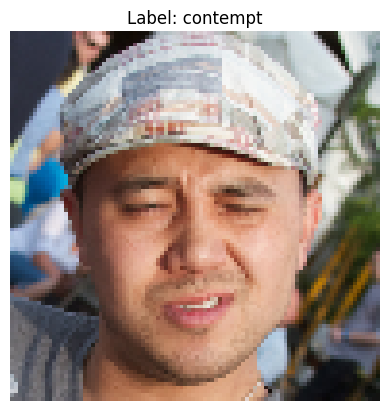

In [ ]:
import matplotlib.pyplot as plt

# Dictionary untuk memetakan label ke kategori
label_map = {
    0: "anger",
    1: "contempt",
    2: "disgust",
    3: "fear",
    4: "happy",
    5: "neutral",
    6: "sad",
    7: "surprise"
}

# Ambil salah satu sample dari dataset
sample = ds_test[100]

# Ambil gambar dan label
image = sample['image']
label = sample['label']

# Ubah label numerik menjadi kategori
label_category = label_map[label]

# Tampilkan gambar dengan label kategori
plt.imshow(image)
plt.axis('off')  # Hilangkan sumbu
plt.title(f"Label: {label_category}")
plt.show()


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
from transformers import BitsAndBytesConfig
from peft import get_peft_model, LoraConfig

bnb_config = BitsAndBytesConfig(
        load_in_4bit=True,
        bnb_4bit_quant_type="nf4",
        bnb_4bit_compute_type=torch.bfloat16
)

lora_config = LoraConfig(
    r=8,
    target_modules=["q_proj", "o_proj", "k_proj", "v_proj", "gate_proj", "up_proj", "down_proj"],
    task_type="CAUSAL_LM",
)
model_id = "google/paligemma-3b-pt-224"
model = PaliGemmaForConditionalGeneration.from_pretrained(model_id, quantization_config=bnb_config, device_map="auto")
processor = PaliGemmaProcessor.from_pretrained(model_id)
model = get_peft_model(model, lora_config)
model.print_trainable_parameters()

Unused kwargs: ['bnb_4bit_compute_type']. These kwargs are not used in <class 'transformers.utils.quantization_config.BitsAndBytesConfig'>.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/62.6k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.95G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/1.74G [00:00<?, ?B/s]

`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/699 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/40.0k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.26M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/24.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

trainable params: 11,298,816 || all params: 2,934,765,296 || trainable%: 0.3850


In [ ]:
for param in model.vision_tower.parameters():
    param.requires_grad = False

for param in model.multi_modal_projector.parameters():
    param.requires_grad = False

In [ ]:
import torch

def collate_fn(examples):
    texts = ["classificate emotion from this image" for example in examples]

    # Pemetaan label numerik menjadi nama kelas
    labels = [label_map[example['label']] for example in examples]

    images = [example["image"].convert("RGB") for example in examples]

    # Tokenisasi dengan label kategori
    tokens = processor(
        text=texts,
        images=images,
        suffix=labels,  # Gunakan label kategori
        return_tensors="pt",
        padding="longest",
        tokenize_newline_separately=False
    )

    tokens = tokens.to(torch.bfloat16).to(device)
    return tokens



In [ ]:
from transformers import TrainingArguments
args=TrainingArguments(
            num_train_epochs=5,
            remove_unused_columns=False,
            per_device_train_batch_size=2,
            gradient_accumulation_steps=2,
            warmup_steps=2,
            learning_rate=2e-5,
            weight_decay=1e-6,
            adam_beta2=0.999,
            logging_steps=100,
            optim="adamw_hf",
            save_strategy="steps",
            save_steps=138,
            push_to_hub=True,
            save_total_limit=1,
            output_dir="emotion_classification",
            bf16=True,
            report_to=["tensorboard"],
            dataloader_pin_memory=False
        )

In [ ]:
from transformers import Trainer

trainer = Trainer(
        model=model,
        train_dataset=ds_train ,
        eval_dataset=ds_test,
        data_collator=collate_fn,
        args=args
        )

trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
Keyword argument `tokenize_newline_separately` is not a valid argument for this processor and will be ignored.
You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your text. For this call, we will infer how many images each text has and add special tokens.
You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your tex

Step,Training Loss
100,2.684700
200,1.282700
300,1.085600
400,0.984500
500,0.861300
600,0.822900
700,0.807100
800,0.753300


You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your text. For this call, we will infer how many images each text has and add special tokens.
You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your text. For this call, we will infer how many images each text has and add special tokens.
You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your text. For this call, we will infer how many images each text has and add special tokens.
Y

TrainOutput(global_step=800, training_loss=1.16025390625, metrics={'train_runtime': 5259.3652, 'train_samples_per_second': 0.608, 'train_steps_per_second': 0.152, 'total_flos': 1.2363074748365184e+16, 'train_loss': 1.16025390625, 'epoch': 5.0})

In [ ]:
trainer.push_to_hub()

CommitInfo(commit_url='https://huggingface.co/digo-prayudha/emotion_classification/commit/50224a7130a69d9a45c4ec3450bd15f4352e43c3', commit_message='End of training', commit_description='', oid='50224a7130a69d9a45c4ec3450bd15f4352e43c3', pr_url=None, repo_url=RepoUrl('https://huggingface.co/digo-prayudha/emotion_classification', endpoint='https://huggingface.co', repo_type='model', repo_id='digo-prayudha/emotion_classification'), pr_revision=None, pr_num=None)

# **Test Classify Image**

In [ ]:
from transformers import PaliGemmaForConditionalGeneration, PaliGemmaProcessor
from peft import PeftModel


# Load adapter hasil fine-tuning
adapter_path = "digo-prayudha/emotion_classification"
model = PeftModel.from_pretrained(model, adapter_path)

# Load processor
processor = PaliGemmaProcessor.from_pretrained(model_id)


adapter_config.json:   0%|          | 0.00/797 [00:00<?, ?B/s]

adapter_model.safetensors:   0%|          | 0.00/45.3M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/peft/peft_model.py:599: UserWarning: Found missing adapter keys while loading the checkpoint: ['base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.lora_A.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.k_proj.lora_B.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.v_proj.lora_A.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.v_proj.lora_B.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.q_proj.lora_A.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.0.self_attn.q_proj.lora_B.default.weight', 'base_model.model.base_model.model.vision_tower.vision_model.encoder.layers.1.self_attn.k_proj.lora_A.default.weight', 'base_model.model.base_model.mod

In [ ]:
from PIL import Image

In [ ]:
# image = Image.open("image.jpg").convert("RGB")
image = Image.open("image.jpg").convert("RGB")

prompt = (
    "Classify the emotion expressed in this image."
)


inputs = processor(
    text=prompt,
    images=image,
    return_tensors="pt",
    padding="longest",
    tokenize_newline_separately=False
).to(model.device)

You are passing both `text` and `images` to `PaliGemmaProcessor`. The processor expects special image tokens in the text, as many tokens as there are images per each text. It is recommended to add `<image>` tokens in the very beginning of your text. For this call, we will infer how many images each text has and add special tokens.


In [ ]:
# Melakukan inferensi dengan model
model.eval()  # Pastikan model dalam mode evaluasi
with torch.no_grad():
    outputs = model.generate(**inputs)

# Decode hasil prediksi
decoded_output = processor.decode(outputs[0], skip_special_tokens=True)

# Tampilkan hasil prediksi
print("Predicted Emotion:", decoded_output)

Predicted Emotion: Classify the emotion expressed in this image.
sad
